**Brian Blaylock**  
**September 26, 2019**

# `rgb.py` Demo

I have gathered several RGB recipies from the [RAMMB CIRA](http://rammb.cira.colostate.edu/training/visit/quick_guides/) website, including:

- TrueColor
- FireTemperature
- AirMass
- DayCloudPhase
- DayConvection
- DayLandCloudFire
- WaterVapor
- DaySnowFog
- etc.

These recipies are in the `make_RGB.py` file in this directory.

For more details on how to generate these plots, see the example on the [Unidata gallery](http://unidata.github.io/python-gallery/examples/mapping_GOES16_TrueColor.html#sphx-glr-examples-mapping-goes16-truecolor-py).

In [1]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from datetime import datetime
import pandas as pd

import sys
sys.path.append('../')
from goes2go.rgb import *
from goes2go.data import goes_latest, goes_nearesttime
from goes2go.tools import abi_crs

In [2]:
DATE = datetime(2020, 9, 22, 18)
G16 = goes_nearesttime(attime=DATE, satellite=16, product='ABI')
G17 = goes_nearesttime(attime=DATE, satellite=17, product='ABI')

 _______________________________
 | Satellite: noaa-goes16      |
 |   Product: ABI-L2-MCMIPC    |
 |    Domain: C                |
📦 Finished downloading [1] files to [/p/home/blaylock/data/noaa-goes16/ABI-L2-MCMIPC].                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              

In [3]:
# Get projection object and sweeps
#crs16, x16, y16 = abi_crs(G16)
#crs17, x17, y17 = abi_crs(G17)

In [11]:
G16[list(G16)[0]]

<xarray.DataArray 'CMI_C01' (y: 1500, x: 2500)>
[3750000 values with dtype=float32]
Coordinates:
    t                    datetime64[ns] 2020-09-22T18:02:31.941746048
  * y                    (y) float32 0.1282 0.1282 0.1281 ... 0.04432 0.04427
  * x                    (x) float32 -0.1013 -0.1013 -0.1012 ... 0.03856 0.03861
    y_image              float32 0.08624
    x_image              float32 -0.03136
    dataset_name         <U74 'OR_ABI-L2-MCMIPC-M6_G16_s20202661801132_e20202...
    date_created         <U22 '2020-09-22T18:04:06.0Z'
    time_coverage_start  <U22 '2020-09-22T18:01:13.2Z'
    time_coverage_end    <U22 '2020-09-22T18:03:50.5Z'
Attributes:
    long_name:              ABI Cloud and Moisture Imagery reflectance factor
    standard_name:          toa_lambertian_equivalent_albedo_multiplied_by_co...
    sensor_band_bit_depth:  10
    downsampling_method:    average
    valid_range:            [   0 4095]
    units:                  1
    resolution:             y: 0.000056 rad x: 0.000056 rad
    grid_mapping:           goes_imager_projection
    cell_methods:           t: point area: sum (interval: 0.000028 rad)
    ancillary_variables:    DQF_C01

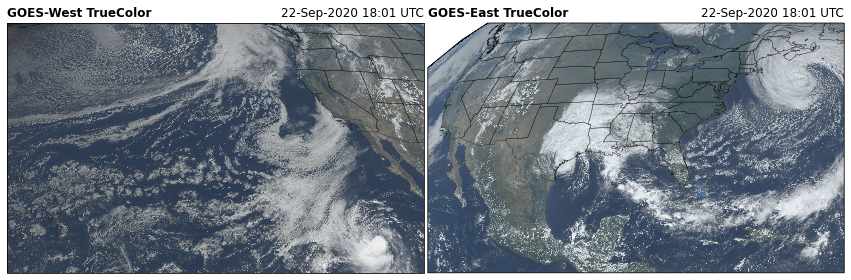

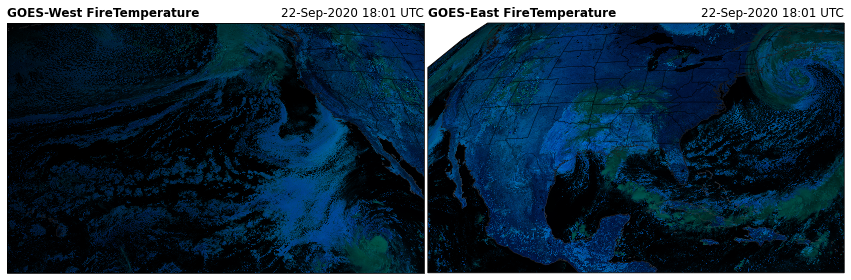

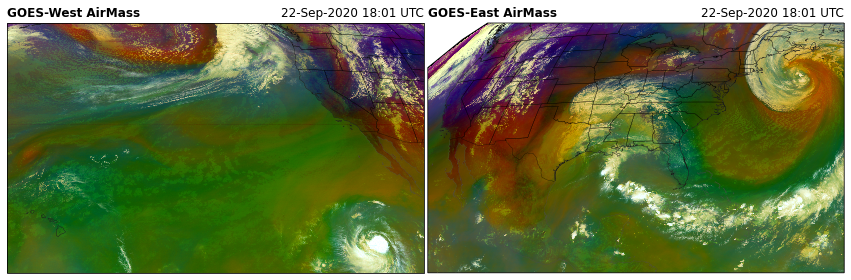

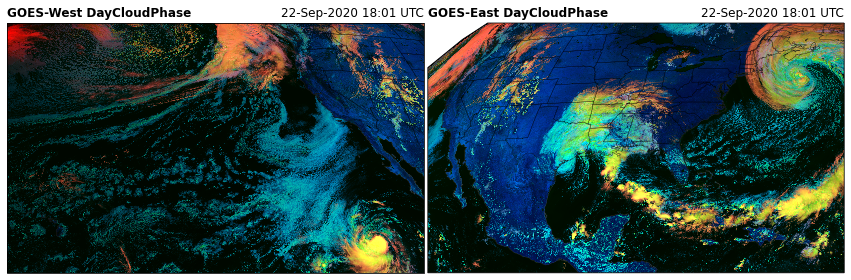

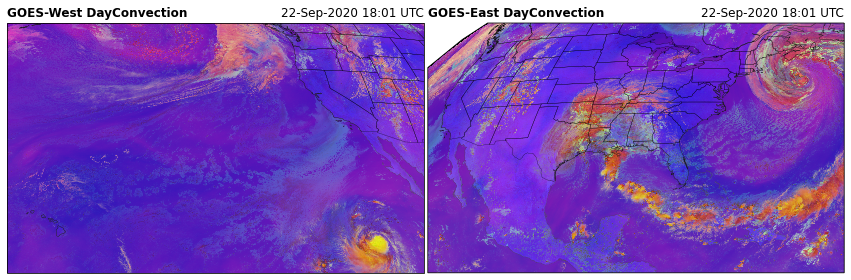

...

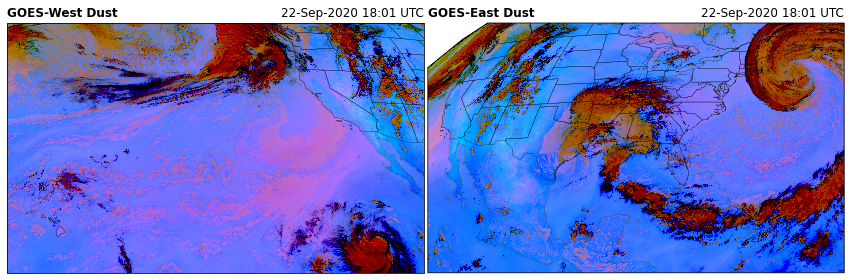

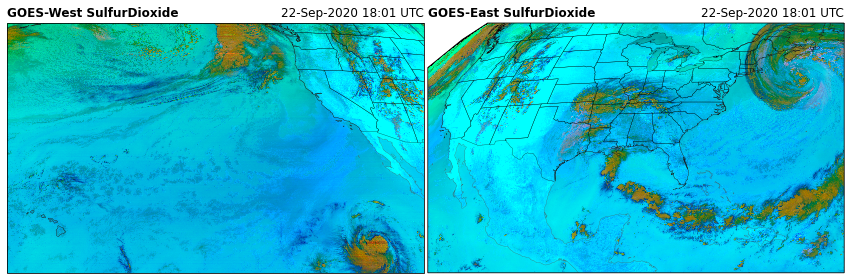

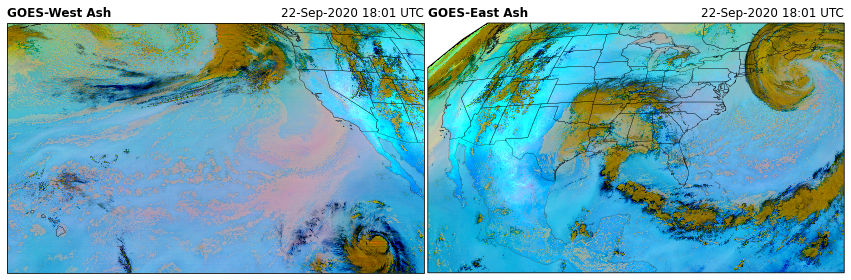

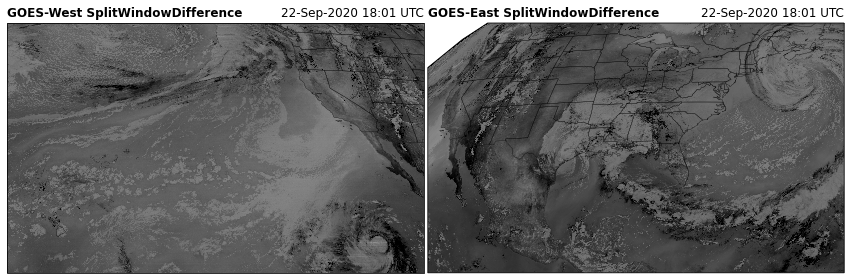

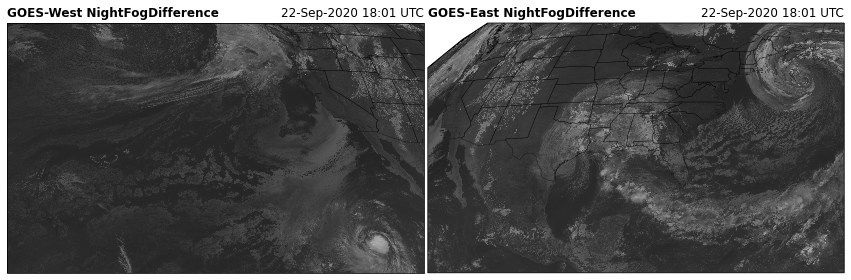

In [22]:
functions = [TrueColor, FireTemperature, AirMass, \
             DayCloudPhase, DayConvection, DayCloudConvection,\
             DayLandCloud, DayLandCloudFire, \
             WaterVapor, DifferentialWaterVapor, \
             DaySnowFog, NighttimeMicrophysics, \
             Dust, SulfurDioxide, Ash, \
             SplitWindowDifference, NightFogDifference]

str_date_16 = f"{pd.to_datetime(G16.time_coverage_start.item()):%d-%b-%Y %H:%M UTC}"
str_date_17 = f"{pd.to_datetime(G16.time_coverage_start.item()):%d-%b-%Y %H:%M UTC}"

for i, func in enumerate(functions):
    fig = plt.figure(figsize=(15, 12))

    RGB17 = func(G17)
    RGB16 = func(G16)
    
    # Create axis with Geostationary projection
    ax17 = fig.add_subplot(1, 2, 1, projection=RGB17.crs)
    ax16 = fig.add_subplot(1, 2, 2, projection=RGB16.crs)
    
    # GOES-West
    ax17.set_title(f'GOES-West {func.__name__}', loc='left', fontweight='bold')
    ax17.set_title(f'{str_date_17}', loc='right')
    ax17.imshow(RGB17[list(RGB17)[0]], **RGB17.imshow_kwargs)
    # Add Coastlines and States
    ax17.coastlines(resolution='50m', color='.3', linewidth=0.25)
    ax17.add_feature(ccrs.cartopy.feature.STATES, linewidth=0.25)
    
    # GOES-East
    ax16.set_title(f'GOES-East {func.__name__}', loc='left', fontweight='bold')
    ax16.set_title(f'{str_date_16}', loc='right')
    ax16.imshow(RGB16[list(RGB16)[0]], **RGB16.imshow_kwargs)
    # Add Coastlines and States
    ax16.coastlines(resolution='50m', color='.3', linewidth=0.25)
    ax16.add_feature(ccrs.cartopy.feature.STATES, linewidth=0.25)
    
    plt.subplots_adjust(wspace=0.01)
    plt.savefig(f'../images/{func.__name__}', bbox_inches='tight')